In [1]:
import pandas as pd
import numpy as np
import math
from sklearn.preprocessing import MinMaxScaler
import umap.umap_ as umap
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import HDBSCAN
from sklearn.cluster import OPTICS
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import altair as alt
alt.data_transformers.disable_max_rows()

C:\Users\msele\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DataTransformerRegistry.enable('default')

In [2]:
df = pd.read_csv('SO_ML_2022_cleaned.csv')
df = df.drop(columns=['Unnamed: 0'])
df['Mass_flow_rate'] = df['velocity']*df['density']
df_so_data = df.copy()
df.head()

,fractional_year,O7_O6_ratio,C6_C4_ratio,C6_C5_ratio,Fe_O_ratio,O_ave_charge,velocity,density,Mass_flow_rate
0,2022.049316,0.089865,2.458390,0.444265,0.150213,6.074951,494.797,2.82344,1397.029642
1,2022.049335,0.083158,2.841864,0.410422,0.160867,6.072842,489.727,2.96590,1452.481309
2,2022.049354,0.098469,2.527932,0.328493,0.132257,6.086165,491.465,2.65348,1304.092548
3,2022.049373,0.070984,2.794871,0.356665,0.135882,6.060820,490.259,2.89073,1417.206399
4,2022.049392,0.078036,1.416381,0.329367,0.154701,6.068972,493.497,2.96546,1463.445614


In [3]:
# scale the data using min/max scaler
cols = df.columns.tolist()[1:]
scaler = MinMaxScaler()
# scaler = StandardScaler()
data_scaled = scaler.fit_transform(df[cols])

### UMAP

In [4]:
import umap.umap_ as umap
fit = umap.UMAP()

In [5]:
umap_2d = umap.UMAP(n_components=2, init='random', random_state=0, n_neighbors=40, metric='euclidean', min_dist=0, spread=0.5) 
data_umap = umap_2d.fit_transform(data_scaled)
df_umap= pd.DataFrame(data_umap, columns=['UMAP1', 'UMAP2'])

C:\Users\msele\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


#### Scatter Plot

In [7]:
chart1 = alt.Chart(df_umap).mark_circle().encode(
    x='UMAP1',
    y='UMAP2',
).configure_axis(titleFontSize=15)


chart1

alt.Chart(...)

### Preprocessing

## K-means clustering

- Client mentioned to start by doing 2, 3, and 4 clusters

#### Deteriming Optimal K

In [105]:
k_vals = list(range(2,5))

sil_scores = []
for k in k_vals:
    model = KMeans(n_clusters=k, random_state=0, n_init='auto').fit(df_umap)
    labels = model.labels_
    sil_scores.append(silhouette_score(df_umap, labels))
# sil_scores


Text(0.5, 0, 'K Value')

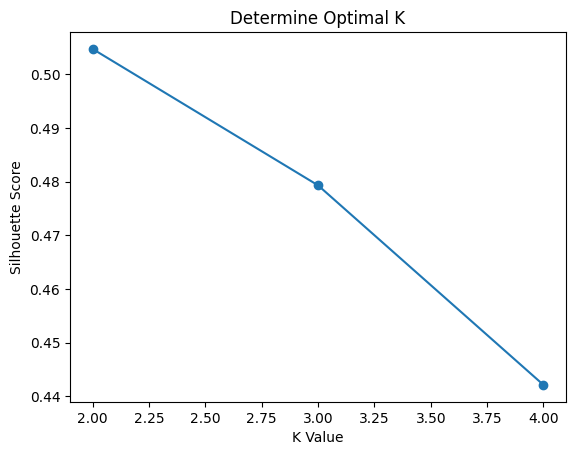

In [106]:
plt.plot(k_vals, sil_scores)
plt.scatter(k_vals, sil_scores)
plt.title('Determine Optimal K')
plt.ylabel('Silhouette Score')
plt.xlabel('K Value')

### K = 2

In [107]:
model = KMeans(n_clusters=2, random_state=0, n_init='auto').fit(df_umap)
labels = model.labels_

df_umap_labelled = df_umap.copy()
df_umap_labelled['Cluster_Label'] = labels
df_umap_labelled['Cluster_Label'] = df_umap_labelled.Cluster_Label.astype('category')

df_so_data_labelled = df_so_data.copy()
df_so_data_labelled['Cluster_Label'] = labels
df_so_data_labelled['Cluster_Label'] = df_so_data_labelled.Cluster_Label.astype('category')

print(f"The silhoette score for K = 2: {silhouette_score(df_umap, labels)}")

The silhoette score for K = 2: 0.5047004818916321


#### Scatter Plots

In [108]:
chart1 = alt.Chart(df_umap_labelled).mark_circle().encode(
    x='UMAP1',
    y='UMAP2',
    color='Cluster_Label'
)


chart1

alt.Chart(...)

In [109]:
features = df_so_data_labelled.columns[1:-1].tolist()
charts = []
for feature in features:
    y_var = 'mean(' + feature + ')'
    chart = alt.Chart(df_so_data_labelled).mark_bar().encode(
        x='Cluster_Label:O',
        y=alt.Y(y_var)
    ).properties(
        width = 200,
        height = 500
    )

    error_bars = alt.Chart(df_so_data_labelled).mark_errorbar(extent='stderr').encode(
        x='Cluster_Label',
        y=feature
    )

    chart = alt.layer(chart, error_bars)
    charts.append(chart)
alt.hconcat(*charts)

alt.HConcatChart(...)

## DBSCAN

Text(0, 0.5, 'Distance')

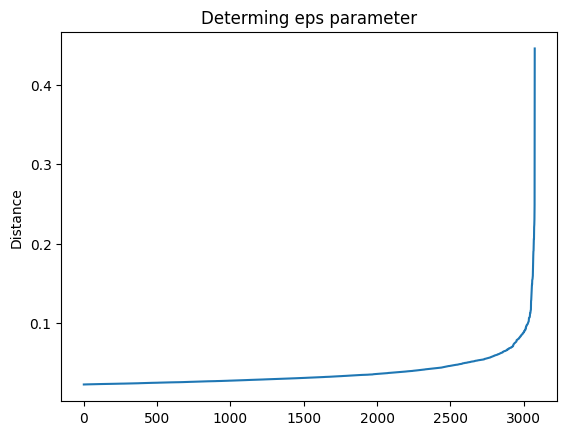

In [111]:
# determine the eps value
KNN = NearestNeighbors(n_neighbors=3)
neighbors = KNN.fit(df_umap)
distances, indices = neighbors.kneighbors(df_umap)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances[17000:])
plt.title('Determing eps parameter')
plt.ylabel('Distance')

Text(0.5, 0, 'min # samples')

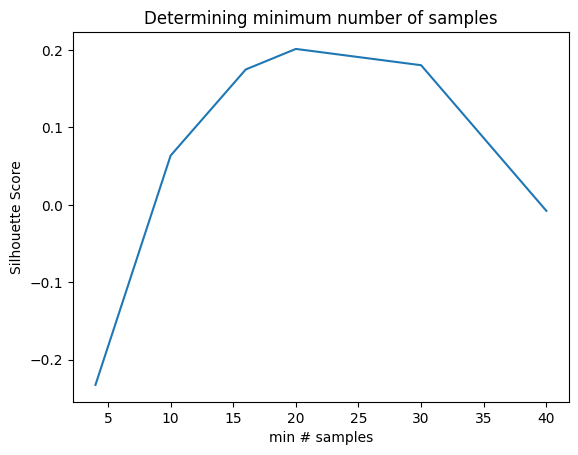

In [59]:
min_samples = [4, 10, 16, 20, 30, 40]
scores = []
for i in min_samples:
    # print("min_samples value is: " + str(i))
    db = DBSCAN(eps=0.08, min_samples=i).fit(df_umap)
    # print(set(db.labels_))
    silhouette_avg = silhouette_score(df_umap, db.labels_)
    # print(silhouette_avg)
    scores.append(silhouette_avg)

plt.plot(min_samples, scores)
plt.title('Determining minimum number of samples')
plt.ylabel('Silhouette Score')
plt.xlabel('min # samples') 

In [145]:
import math
min_samples = [10, 20, 30, 40, 50, 100, 200, 500]
eps = [0.05, 0.06, 0.07, 0.08, 0.09]

min_samples_to_df = []
eps_to_df = []
num_clusters_to_df = []
sil_scores_to_df = []

for ms in min_samples:
    for e in eps:
        db = DBSCAN(eps=e, min_samples=ms).fit(df_umap)
        num_labels = len(set(db.labels_))
        if num_labels == 1:
            num_clusters_to_df.append(num_labels)
            sil_scores_to_df.append(math.nan)
            min_samples_to_df.append(ms)
            eps_to_df.append(e)
        else:
            num_clusters_to_df.append(num_labels)
            sil_scores_to_df.append(silhouette_score(df_umap, db.labels_))
            min_samples_to_df.append(ms)
            eps_to_df.append(e)

df_param_search = pd.DataFrame(zip(min_samples_to_df, eps_to_df, num_clusters_to_df, sil_scores_to_df), 
                               columns=['min_samples', 'eps', 'num_clusters', 'silhouette_score'])
df_param_search.sort_values(by=['silhouette_score'], ascending=False)

,min_samples,eps,num_clusters,silhouette_score
0,10,0.05,208,0.172380
1,10,0.06,128,0.134375
2,10,0.07,91,0.130805
3,10,0.08,69,0.063584
4,10,0.09,56,0.136184
5,20,0.05,185,-0.027924
6,20,0.06,171,0.143756
7,20,0.07,145,0.214645
8,20,0.08,102,0.201442
9,20,0.09,84,0.195597


#### Final DBSCAN Model

In [146]:
db = DBSCAN(eps=0.07, min_samples=20).fit(df_umap)

df_umap_labelled = df_umap.copy()
df_umap_labelled['Cluster_Label'] = db.labels_
df_umap_labelled['Cluster_Label'] = df_umap_labelled.Cluster_Label.astype('category')

df_so_data_labelled = df_so_data.copy()
df_so_data_labelled['Cluster_Label'] = db.labels_
df_so_data_labelled['Cluster_Label'] = df_so_data_labelled.Cluster_Label.astype('category')

print(f"The silhouette score of the final model is: {silhouette_score(df_umap, db.labels_)}")

The silhouette score of the final model is: 0.21464532613754272


#### Scatter Plots

In [147]:
chart1 = alt.Chart(df_umap_labelled).mark_circle().encode(
    x='UMAP1',
    y='UMAP2',
    color='Cluster_Label'
)

chart1

alt.Chart(...)

## HDBSCAN

In [136]:
min_cluster_size = [500, 1000, 1200, 1500, 2000, 5000]
cluster_selection_epsilon = [0.05, 0.06, 0.07, 0.08, 0.09]
cluster_selection_method = ['eom', 'leaf']

min_cluster_size_to_df = []
cluster_selection_epsilon_to_df = []
cluster_selection_method_to_df = []
sil_scores_to_df = []

for mcs in min_cluster_size:
    for cse in cluster_selection_epsilon:
        for csm in cluster_selection_method:
            hdb = HDBSCAN(min_cluster_size=mcs, cluster_selection_epsilon=cse, cluster_selection_method=csm).fit(df_umap)
            num_labels = len(set(hdb.labels_))
            if num_labels == 1:
                sil_scores_to_df.append(math.nan)
                min_cluster_size_to_df.append(mcs)
                cluster_selection_epsilon_to_df.append(cse)
                cluster_selection_method_to_df.append(csm)
            else:
                sil_scores_to_df.append(silhouette_score(df_umap, hdb.labels_))
                min_cluster_size_to_df.append(mcs)
                cluster_selection_epsilon_to_df.append(cse)
                cluster_selection_method_to_df.append(csm)

df_param_search = pd.DataFrame(zip(min_cluster_size_to_df, cluster_selection_epsilon_to_df, cluster_selection_method_to_df, sil_scores_to_df), 
                               columns=['min_cluster_size', 'cluster_selection_epsilon', 'cluster_selection_method', 'silhouette_score'])

df_param_search.sort_values(by=['silhouette_score'], ascending=False)

In [137]:
df_param_search

,min_cluster_size,cluster_selection_epsilon,cluster_selection_method,silhouette_score
0,500,0.05,eom,0.357765
1,500,0.05,leaf,-0.125884
2,500,0.06,eom,0.357765
3,500,0.06,leaf,-0.125884
4,500,0.07,eom,0.357765
5,500,0.07,leaf,-0.125884
6,500,0.08,eom,0.357765
7,500,0.08,leaf,-0.125884
8,500,0.09,eom,0.357765
9,500,0.09,leaf,-0.125884


#### Final HDBSCAN Model

In [138]:
hdb = HDBSCAN(min_cluster_size=500, cluster_selection_epsilon=0.05, cluster_selection_method='eom').fit(df_umap)
# hdb = HDBSCAN(min_cluster_size=200).fit(data_scaled)
# data_scaled
labels = hdb.labels_

df_umap_labelled = df_umap.copy()
df_umap_labelled['Cluster_Label'] = labels
df_umap_labelled['Cluster_Label'] = df_umap_labelled.Cluster_Label.astype('category')

df_so_data_labelled = df_so_data.copy()
df_so_data_labelled['Cluster_Label'] = labels
df_so_data_labelled['Cluster_Label'] = df_so_data_labelled.Cluster_Label.astype('category')

print(f"The silhouette score of the final model is: {silhouette_score(df_umap, labels)}")
# print(f"The silhouette score of the final model is: {silhouette_score(data_scaled, labels)}")

The silhouette score of the final model is: 0.3577646315097809


#### Scatter Plots

In [139]:
chart1 = alt.Chart(df_umap_labelled).mark_circle().encode(
    x='UMAP1',
    y='UMAP2',
    color='Cluster_Label'
)


chart1 

alt.Chart(...)

#### Bar Charts

In [140]:
features = df_so_data_labelled.columns[1:-1].tolist()
charts = []
for feature in features:
    y_var = 'mean(' + feature + ')'
    chart = alt.Chart(df_so_data_labelled).mark_bar().encode(
        x='Cluster_Label:O',
        y=alt.Y(y_var)
    ).properties(
        width = 200,
        height = 500
    )

    error_bars = alt.Chart(df_so_data_labelled).mark_errorbar(extent='stderr').encode(
        x='Cluster_Label',
        y=feature
    )

    chart = alt.layer(chart, error_bars)
    charts.append(chart)
alt.hconcat(*charts)

alt.HConcatChart(...)